In [1]:
import pandas as pd
import ast
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import time as t

# Preprocessing
from sklearn.preprocessing import MultiLabelBinarizer

# Natural Language Processing
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
import plotly as py
import plotly.io as pio
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Sentiment Analysis
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA

# Models
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Model evaluation
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import metrics
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, roc_auc_score
import nasdaqdatalink
data = nasdaqdatalink.get('WIKI/TSLA')
import quandl
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (16,9)
plt.rcParams["font.size"] = 20
from dash import Dash, html, dcc
import app

import warnings
warnings.filterwarnings('ignore')

In [2]:
# NLP processing from the nltk package
# Instantiate tokenizer to break text into lists of words
#tokenizer = RegexpTokenizer(r'\w+')
tokenizer = RegexpTokenizer(r'[a-zA-Z0-9_@-]+')
# Instantiate lemmatizer to turn plural words into singular for better comparison
lemmatizer = WordNetLemmatizer()


In [3]:
tesla = data

In [4]:
tesla = pd.read_csv("tesla.csv")
#Date needs to be in datetime format to plot timeseries
tesla['Date'] = pd.to_datetime(tesla['Date'])
tesla.index = range(len(tesla))
tesla.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-06-29,19.000000,25.00,17.540001,23.889999,23.889999,18766300
1,2010-06-30,25.790001,30.42,23.299999,23.830000,23.830000,17187100
2,2010-07-01,25.000000,25.92,20.270000,21.959999,21.959999,8218800
3,2010-07-02,23.000000,23.10,18.709999,19.200001,19.200001,5139800
4,2010-07-06,20.000000,20.00,15.830000,16.110001,16.110001,6866900


In [5]:
pd.tesla = tesla

In [6]:
tesla.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2416 entries, 0 to 2415
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       2416 non-null   datetime64[ns]
 1   Open       2416 non-null   float64       
 2   High       2416 non-null   float64       
 3   Low        2416 non-null   float64       
 4   Close      2416 non-null   float64       
 5   Adj Close  2416 non-null   float64       
 6   Volume     2416 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 132.2 KB


In [7]:
tesla

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-06-29,19.000000,25.000000,17.540001,23.889999,23.889999,18766300
1,2010-06-30,25.790001,30.420000,23.299999,23.830000,23.830000,17187100
2,2010-07-01,25.000000,25.920000,20.270000,21.959999,21.959999,8218800
3,2010-07-02,23.000000,23.100000,18.709999,19.200001,19.200001,5139800
4,2010-07-06,20.000000,20.000000,15.830000,16.110001,16.110001,6866900
...,...,...,...,...,...,...,...
2411,2020-01-28,568.489990,576.809998,558.080017,566.900024,566.900024,11788500
2412,2020-01-29,575.690002,589.799988,567.429993,580.989990,580.989990,17801500
2413,2020-01-30,632.419983,650.880005,618.000000,640.809998,640.809998,29005700
2414,2020-01-31,640.000000,653.000000,632.520020,650.570007,650.570007,15719300


In [8]:

from dash import Dash, html
import pandas as pd

df = pd.read_csv('tesla.csv')


def generate_table(dataframe, max_rows=10):
    return html.Table([
        html.Thead(
            html.Tr([html.Th(col) for col in dataframe.columns])
        ),
        html.Tbody([
            html.Tr([
                html.Td(dataframe.iloc[i][col]) for col in dataframe.columns
            ]) for i in range(min(len(dataframe), max_rows))
        ])
    ])


app = Dash(__name__)

app.layout = html.Div([
    html.H4(children='US Agriculture Exports (2011)'),
    generate_table(df)
])


In [9]:
df

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-06-29,19.000000,25.000000,17.540001,23.889999,23.889999,18766300
1,2010-06-30,25.790001,30.420000,23.299999,23.830000,23.830000,17187100
2,2010-07-01,25.000000,25.920000,20.270000,21.959999,21.959999,8218800
3,2010-07-02,23.000000,23.100000,18.709999,19.200001,19.200001,5139800
4,2010-07-06,20.000000,20.000000,15.830000,16.110001,16.110001,6866900
...,...,...,...,...,...,...,...
2411,2020-01-28,568.489990,576.809998,558.080017,566.900024,566.900024,11788500
2412,2020-01-29,575.690002,589.799988,567.429993,580.989990,580.989990,17801500
2413,2020-01-30,632.419983,650.880005,618.000000,640.809998,640.809998,29005700
2414,2020-01-31,640.000000,653.000000,632.520020,650.570007,650.570007,15719300


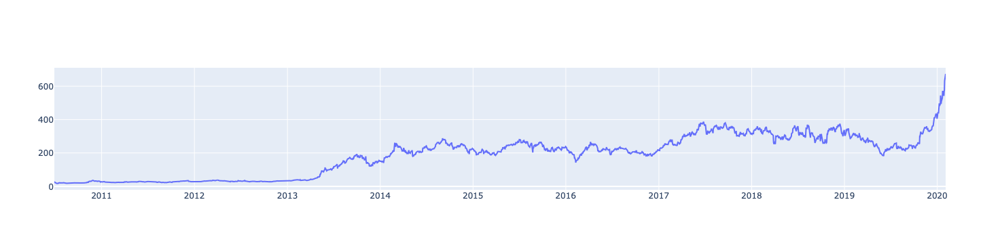

In [10]:
fig = go.Figure([go.Scatter(x=tesla['Date'], y=tesla['Open'])])
fig.show()

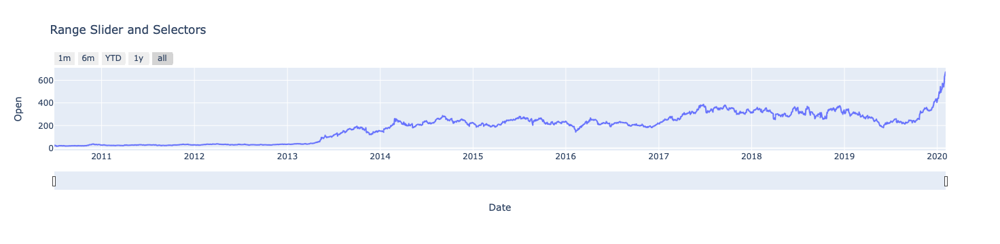

In [11]:
fig = px.line(tesla, x='Date', y='Open', title='Range Slider and Selectors')

fig.update_xaxes(rangeslider_visible=True, rangeselector=dict(
    buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

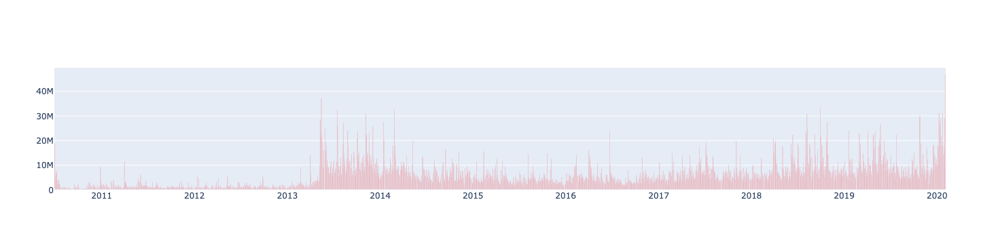

In [12]:
fi = go.Figure()
fi.add_trace(go.Bar(x=tesla['Date'], y=tesla['Volume'],marker_color='red'))

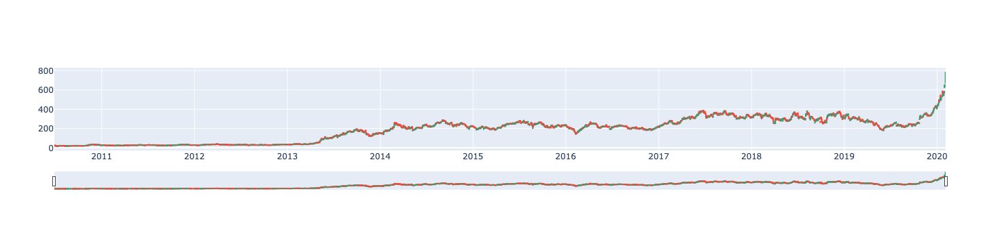

In [13]:
fig = go.Figure(data=[go.Candlestick(x=tesla['Date'],
                open=tesla['Open'],
                high=tesla['High'],
                low=tesla['Low'],
                close=tesla['Close'])])

fig.show()

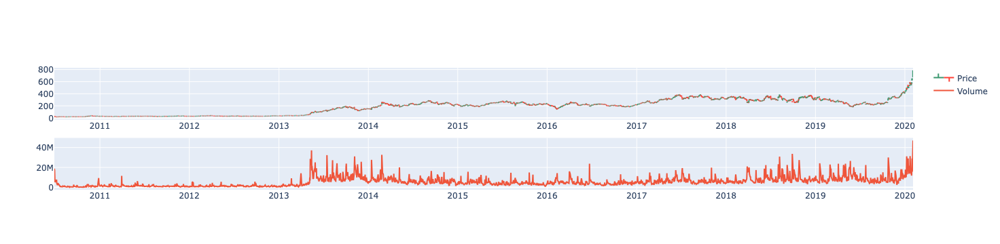

In [14]:
fig = make_subplots(rows=2, cols=1)

#OHLC Plot
fig.add_trace(go.Ohlc(x=tesla.Date, open=tesla.Open, high=tesla.High, low=tesla.Low, close=tesla.Close, name='Price'), row=1, col=1)
#Volume PLot
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.Volume, name='Volume'), row=2, col=1)

fig.update(layout_xaxis_rangeslider_visible=False)
fig.show()

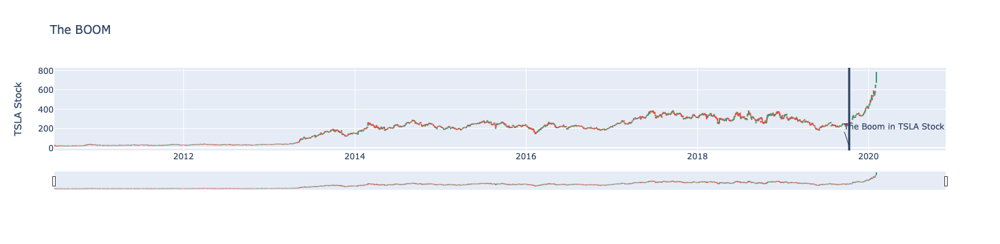

In [15]:
fig = go.Figure(data=go.Ohlc(x=tesla['Date'],
                open=tesla['Open'],
                high=tesla['High'],
                low=tesla['Low'],
                close=tesla['Close']))

fig.update_layout(
    title='The BOOM',
    yaxis_title='TSLA Stock',
    shapes = [dict(x0='2019-10-10', x1='2019-10-10', y0=0, y1=1, xref='x', yref='paper',line_width=3)],
    annotations=[dict(x='2019-10-10', y=0.05, xref='x', yref='paper', xanchor='left', text='The Boom in TSLA Stock')]
)

fig.show()

In [16]:
#EMA
tesla['EMA_9'] = tesla['Close'].ewm(9).mean().shift()
tesla['EMA_22'] = tesla['Close'].ewm(22).mean().shift()
#SMA
tesla['SMA_5'] = tesla['Close'].rolling(5).mean().shift()
tesla['SMA_10'] = tesla['Close'].rolling(10).mean().shift()
tesla['SMA_15'] = tesla['Close'].rolling(15).mean().shift()
tesla['SMA_30'] = tesla['Close'].rolling(30).mean().shift()
#RSI14
def RSI(df, n=14):
    close = tesla['Close']
    delta = close.diff()
    delta = delta[1:]
    pricesUp = delta.copy()
    pricesDown = delta.copy()
    pricesUp[pricesUp < 0] = 0
    pricesDown[pricesDown > 0] = 0
    rollUp = pricesUp.rolling(n).mean()
    rollDown = pricesDown.abs().rolling(n).mean()
    rs = rollUp / rollDown
    rsi = 100.0 - (100.0 / (1.0 + rs))
    return rsi

tesla['RSI'] = RSI(tesla).fillna(0)

EMA_12 = pd.Series(tesla['Close'].ewm(span=12, min_periods=12).mean())
EMA_26 = pd.Series(tesla['Close'].ewm(span=26, min_periods=26).mean())
tesla['MACD'] = pd.Series(EMA_12 - EMA_26)
tesla['MACD_signal'] = pd.Series(tesla.MACD.ewm(span=9, min_periods=9).mean()) # Code to trace the moving avrgs 

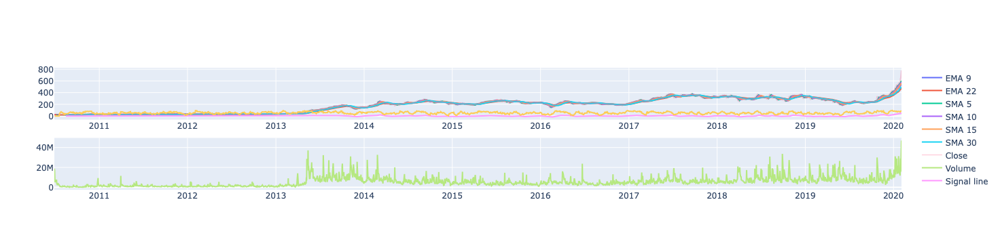

In [17]:
fig = go.Figure()
fig = make_subplots(rows=2, cols=1)


fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.EMA_9, name='EMA 9'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.EMA_22, name='EMA 22'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_5, name='SMA 5'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_10, name='SMA 10'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_15, name='SMA 15'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_30, name='SMA 30'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.Close, name='Close', opacity=0.3))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.Volume, name='Volume'), row=2, col=1)
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla['MACD_signal'], name='Signal line'), row=1, col=1)
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.RSI, name='RSI'))

fig.show()

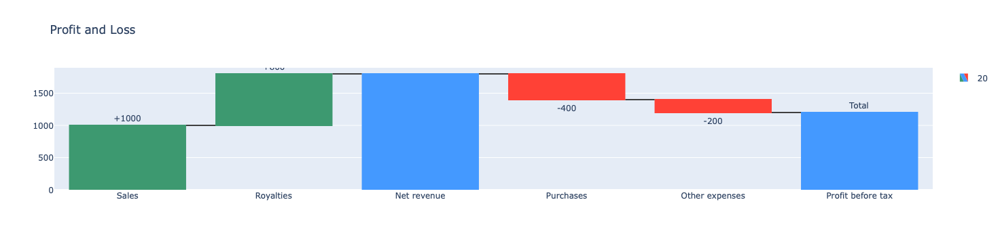

In [18]:
fig = go.Figure(go.Waterfall(
    name = "20", orientation = "v",
    measure = ["relative", "relative", "total", "relative", "relative", "total"],
    x = ["Sales", "Royalties", "Net revenue", "Purchases", "Other expenses", "Profit before tax"],
    textposition = "outside",
    text = ["+1000", "+800", "", "-400", "-200", "Total"],
    y = [1000, 800, 0, -400, -200, 0],
    connector = {"line":{"color":"rgb(63, 63, 63)"}},
))


fig.update_layout(
        title = "Profit and Loss",
        showlegend = True
)

fig.show()

NAME & DATE 

<img src="dumbster.jpg"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 20px;" />

## My name is Joey G, And this is not financial Advice !! 

Executive SUMMARY 

Plan of Action 

Questions // Take aways // Hypothesis // Answers 

In [19]:
tesla # First look at the Data above graphs are for refrence ..... Now we get to work 

,Date,Open,High,Low,Close,Adj Close,Volume,EMA_9,EMA_22,SMA_5,SMA_10,SMA_15,SMA_30,RSI,MACD,MACD_signal
0,2010-06-29,19.000000,25.000000,17.540001,23.889999,23.889999,18766300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2010-06-30,25.790001,30.420000,23.299999,23.830000,23.830000,17187100,23.889999,23.889999,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
2,2010-07-01,25.000000,25.920000,20.270000,21.959999,21.959999,8218800,23.858421,23.859333,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
3,2010-07-02,23.000000,23.100000,18.709999,19.200001,19.200001,5139800,23.157896,23.197880,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
4,2010-07-06,20.000000,20.000000,15.830000,16.110001,16.110001,6866900,22.007011,22.130814,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2411,2020-01-28,568.489990,576.809998,558.080017,566.900024,566.900024,11788500,506.346531,441.846606,562.360010,541.707001,519.286668,462.757668,73.404463,44.844805,42.681788
2412,2020-01-29,575.690002,589.799988,567.429993,580.989990,580.989990,17801500,512.401880,447.283711,566.300012,545.911005,526.977336,469.665002,72.209166,45.090134,43.163457
2413,2020-01-30,632.419983,650.880005,618.000000,640.809998,640.809998,29005700,519.260691,453.097028,568.586011,550.218005,534.439335,477.085002,82.015666,49.540463,44.438858
2414,2020-01-31,640.000000,653.000000,632.520020,650.570007,650.570007,15719300,531.415622,461.258461,582.308008,562.449005,544.350667,485.728668,83.725850,53.241199,46.199326


In [20]:
tesla.set_index('Date') # setting the index to date as to seeing this is a time series and the date is my most important mitagating factor 

,Open,High,Low,Close,Adj Close,Volume,EMA_9,EMA_22,SMA_5,SMA_10,SMA_15,SMA_30,RSI,MACD,MACD_signal
Date,,,,,,,,,,,,,,,
2010-06-29,19.000000,25.000000,17.540001,23.889999,23.889999,18766300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-06-30,25.790001,30.420000,23.299999,23.830000,23.830000,17187100,23.889999,23.889999,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
2010-07-01,25.000000,25.920000,20.270000,21.959999,21.959999,8218800,23.858421,23.859333,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
2010-07-02,23.000000,23.100000,18.709999,19.200001,19.200001,5139800,23.157896,23.197880,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
2010-07-06,20.000000,20.000000,15.830000,16.110001,16.110001,6866900,22.007011,22.130814,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-28,568.489990,576.809998,558.080017,566.900024,566.900024,11788500,506.346531,441.846606,562.360010,541.707001,519.286668,462.757668,73.404463,44.844805,42.681788
2020-01-29,575.690002,589.799988,567.429993,580.989990,580.989990,17801500,512.401880,447.283711,566.300012,545.911005,526.977336,469.665002,72.209166,45.090134,43.163457
2020-01-30,632.419983,650.880005,618.000000,640.809998,640.809998,29005700,519.260691,453.097028,568.586011,550.218005,534.439335,477.085002,82.015666,49.540463,44.438858


## A look at the Data through a visual ....

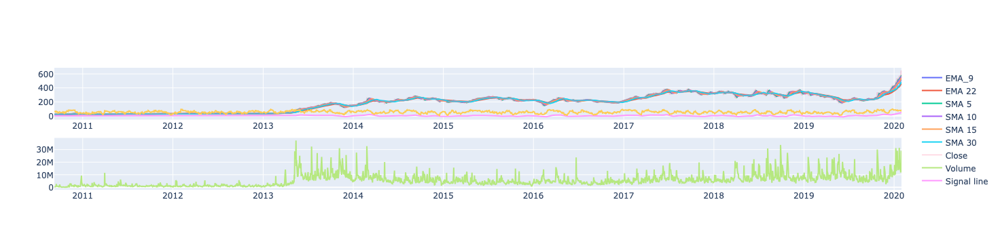

In [44]:
fig = go.Figure()
fig = make_subplots(rows=2, cols=1)


fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.EMA_9, name='EMA_9'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.EMA_22, name='EMA 22'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_5, name='SMA 5'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_10, name='SMA 10'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_15, name='SMA 15'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_30, name='SMA 30'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.Close, name='Close', opacity=0.3))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.Volume, name='Volume'), row=2, col=1)
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla['MACD_signal'], name='Signal line'), row=1, col=1)
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.RSI, name='RSI'))

fig.show()

###  CREATING PRICE DIFF AND RETURN 

In [22]:
tesla['PriceDiff'] = tesla['Close'].shift(-1) - tesla['Close']
print(tesla['PriceDiff'])

0        -0.059999
1        -1.870001
2        -2.759998
3        -3.090000
4        -0.310001
           ...    
2411     14.089966
2412     59.820008
2413      9.760009
2414    129.429993
2415           NaN
Name: PriceDiff, Length: 2416, dtype: float64


In [23]:
tesla.head()

,Date,Open,High,Low,Close,Adj Close,Volume,EMA_9,EMA_22,SMA_5,SMA_10,SMA_15,SMA_30,RSI,MACD,MACD_signal,PriceDiff
0,2010-06-29,19.000000,25.00,17.540001,23.889999,23.889999,18766300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.059999
1,2010-06-30,25.790001,30.42,23.299999,23.830000,23.830000,17187100,23.889999,23.889999,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-1.870001
2,2010-07-01,25.000000,25.92,20.270000,21.959999,21.959999,8218800,23.858421,23.859333,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-2.759998
3,2010-07-02,23.000000,23.10,18.709999,19.200001,19.200001,5139800,23.157896,23.197880,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-3.090000
4,2010-07-06,20.000000,20.00,15.830000,16.110001,16.110001,6866900,22.007011,22.130814,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-0.310001


In [24]:
tesla['Return'] = tesla['PriceDiff'] /tesla['Close']
print(tesla['Return'])

0      -0.002511
1      -0.078473
2      -0.125683
3      -0.160937
4      -0.019243
          ...   
2411    0.024854
2412    0.102962
2413    0.015231
2414    0.198949
2415         NaN
Name: Return, Length: 2416, dtype: float64


In [25]:
tesla.head()

,Date,Open,High,Low,Close,Adj Close,Volume,EMA_9,EMA_22,SMA_5,SMA_10,SMA_15,SMA_30,RSI,MACD,MACD_signal,PriceDiff,Return
0,2010-06-29,19.000000,25.00,17.540001,23.889999,23.889999,18766300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.059999,-0.002511
1,2010-06-30,25.790001,30.42,23.299999,23.830000,23.830000,17187100,23.889999,23.889999,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-1.870001,-0.078473
2,2010-07-01,25.000000,25.92,20.270000,21.959999,21.959999,8218800,23.858421,23.859333,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-2.759998,-0.125683
3,2010-07-02,23.000000,23.10,18.709999,19.200001,19.200001,5139800,23.157896,23.197880,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-3.090000,-0.160937
4,2010-07-06,20.000000,20.00,15.830000,16.110001,16.110001,6866900,22.007011,22.130814,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-0.310001,-0.019243


## Rolling avg mac 50 , or moving avg this is something i will have to investigate to make sure this is right!! 

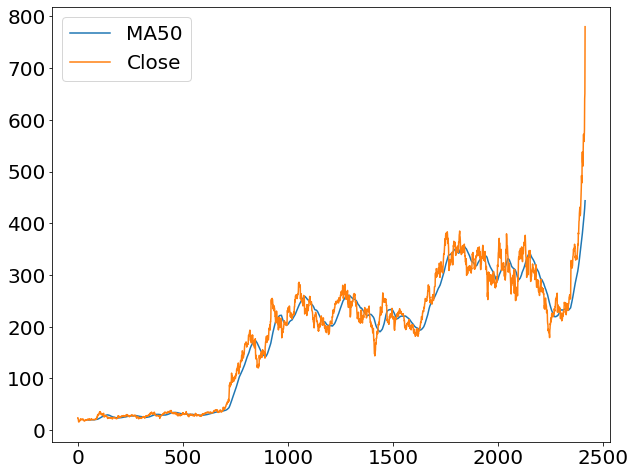

In [26]:
tesla['ma50'] = tesla['Close'].rolling(50).mean()
#plot the moving average
plt.figure(figsize=(10, 8))
tesla['ma50'].plot(label='MA50')
tesla['Close'].plot(label='Close')
plt.legend()
plt.show()

In [27]:
tesla.head()

,Date,Open,High,Low,Close,Adj Close,Volume,EMA_9,EMA_22,SMA_5,SMA_10,SMA_15,SMA_30,RSI,MACD,MACD_signal,PriceDiff,Return,ma50
0,2010-06-29,19.000000,25.00,17.540001,23.889999,23.889999,18766300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.059999,-0.002511,NaN
1,2010-06-30,25.790001,30.42,23.299999,23.830000,23.830000,17187100,23.889999,23.889999,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-1.870001,-0.078473,NaN
2,2010-07-01,25.000000,25.92,20.270000,21.959999,21.959999,8218800,23.858421,23.859333,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-2.759998,-0.125683,NaN
3,2010-07-02,23.000000,23.10,18.709999,19.200001,19.200001,5139800,23.157896,23.197880,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-3.090000,-0.160937,NaN
4,2010-07-06,20.000000,20.00,15.830000,16.110001,16.110001,6866900,22.007011,22.130814,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-0.310001,-0.019243,NaN


In [28]:
tesla['MA10'] = tesla['Close'].rolling(10).mean()
tesla['MA50'] = tesla['Close'].rolling(50).mean()
tesla = tesla.dropna()
tesla.head()

,Date,Open,High,Low,Close,Adj Close,Volume,EMA_9,EMA_22,SMA_5,...,SMA_15,SMA_30,RSI,MACD,MACD_signal,PriceDiff,Return,ma50,MA10,MA50
49,2010-09-08,20.660000,20.950001,20.600000,20.900000,20.900000,288400,19.952238,19.827703,20.516,...,19.796000,19.796667,67.149781,0.287315,0.100293,-0.190001,-0.009091,19.8336,20.270,19.8336
50,2010-09-09,21.000000,21.049999,20.690001,20.709999,20.709999,376200,20.047505,19.879988,20.800,...,19.912667,19.808334,65.047025,0.301901,0.140736,-0.539999,-0.026074,19.7700,20.351,19.7700
51,2010-09-10,20.750000,20.930000,19.760000,20.170000,20.170000,386600,20.114063,19.920247,20.852,...,20.042000,19.808000,58.093807,0.267530,0.166157,0.549999,0.027268,19.6968,20.393,19.6968
52,2010-09-13,20.889999,20.900000,20.500000,20.719999,20.719999,360800,20.119680,19.932301,20.674,...,20.134000,19.802000,54.812404,0.280736,0.189117,0.400002,0.019305,19.6720,20.495,19.6720
53,2010-09-14,20.540001,21.600000,20.530001,21.120001,21.120001,654700,20.179938,19.970135,20.608,...,20.242000,19.828000,67.142869,0.319319,0.215198,0.859999,0.040720,19.7104,20.620,19.7104


In [29]:
tesla['Shares'] = [1 if tesla.loc[ei, 'MA10']>tesla.loc[ei, 'MA50'] else 0 for ei in tesla.index]

In [30]:
tesla.head()

,Date,Open,High,Low,Close,Adj Close,Volume,EMA_9,EMA_22,SMA_5,...,SMA_30,RSI,MACD,MACD_signal,PriceDiff,Return,ma50,MA10,MA50,Shares
49,2010-09-08,20.660000,20.950001,20.600000,20.900000,20.900000,288400,19.952238,19.827703,20.516,...,19.796667,67.149781,0.287315,0.100293,-0.190001,-0.009091,19.8336,20.270,19.8336,1
50,2010-09-09,21.000000,21.049999,20.690001,20.709999,20.709999,376200,20.047505,19.879988,20.800,...,19.808334,65.047025,0.301901,0.140736,-0.539999,-0.026074,19.7700,20.351,19.7700,1
51,2010-09-10,20.750000,20.930000,19.760000,20.170000,20.170000,386600,20.114063,19.920247,20.852,...,19.808000,58.093807,0.267530,0.166157,0.549999,0.027268,19.6968,20.393,19.6968,1
52,2010-09-13,20.889999,20.900000,20.500000,20.719999,20.719999,360800,20.119680,19.932301,20.674,...,19.802000,54.812404,0.280736,0.189117,0.400002,0.019305,19.6720,20.495,19.6720,1
53,2010-09-14,20.540001,21.600000,20.530001,21.120001,21.120001,654700,20.179938,19.970135,20.608,...,19.828000,67.142869,0.319319,0.215198,0.859999,0.040720,19.7104,20.620,19.7104,1


## Calculated Profit is  
>`Tomorrow` - the close price of `Today`

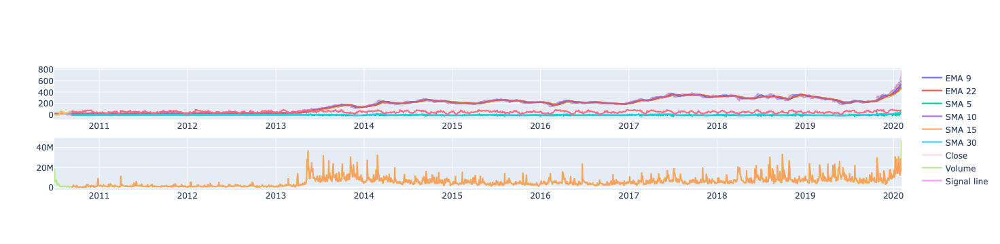

In [39]:
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.EMA_9, name='EMA 9'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.EMA_22, name='EMA 22'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_5, name='SMA 5'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_10, name='SMA 10'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_15, name='SMA 15'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_30, name='SMA 30'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.Profit, name='Profit'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.Close, name='Close', opacity=0.3))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.Volume, name='Volume'), row=2, col=1)
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla['MACD_signal'], name='Signal line'), row=1, col=1)
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.RSI, name='RSI'))

fig.show()

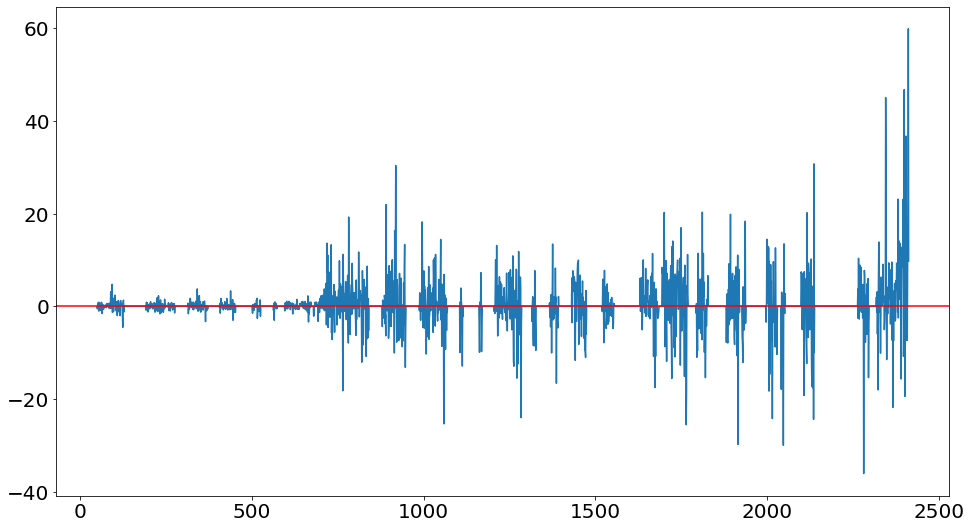

In [32]:
tesla['Close1'] = tesla['Close'].shift(-1)
tesla['Profit'] = [tesla.loc[ei, 'Close1'] - tesla.loc[ei, 'Close'] if tesla.loc[ei, 'Shares']==1 else 0 for ei in tesla.index]
tesla['Profit'].plot()
plt.axhline(y=0, color='red')

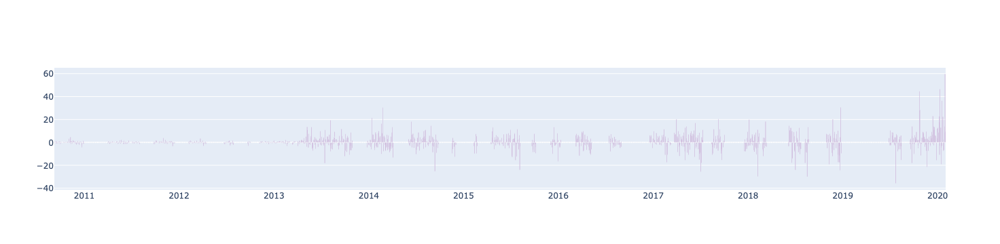

In [33]:
fi = go.Figure()
fi.add_trace(go.Bar(x=tesla['Date'], y=tesla['Profit'],marker_color='purple'))

## Wealth is the Indication that we have kept our money

In [34]:
tesla['wealth'] = tesla['Profit'].cumsum()
tesla.tail()

,Date,Open,High,Low,Close,Adj Close,Volume,EMA_9,EMA_22,SMA_5,...,MACD_signal,PriceDiff,Return,ma50,MA10,MA50,Shares,Close1,Profit,wealth
2410,2020-01-27,541.989990,564.440002,539.280029,558.020020,558.020020,13608100,500.605032,436.565996,552.856006,...,42.141033,8.880004,0.015913,414.357601,541.707001,414.357601,1,566.900024,8.880004,445.650008
2411,2020-01-28,568.489990,576.809998,558.080017,566.900024,566.900024,11788500,506.346531,441.846606,562.360010,...,42.681788,14.089966,0.024854,418.773402,545.911005,418.773402,1,580.989990,14.089966,459.739974
2412,2020-01-29,575.690002,589.799988,567.429993,580.989990,580.989990,17801500,512.401880,447.283711,566.300012,...,43.163457,59.820008,0.102962,423.406202,550.218005,423.406202,1,640.809998,59.820008,519.559982
2413,2020-01-30,632.419983,650.880005,618.000000,640.809998,640.809998,29005700,519.260691,453.097028,568.586011,...,44.438858,9.760009,0.015231,429.179001,562.449005,429.179001,1,650.570007,9.760009,529.319991
2414,2020-01-31,640.000000,653.000000,632.520020,650.570007,650.570007,15719300,531.415622,461.258461,582.308008,...,46.199326,129.429993,0.198949,435.190602,576.157007,435.190602,1,NaN,NaN,NaN


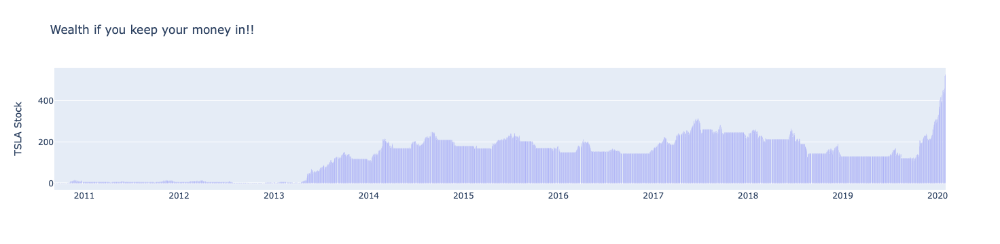

In [35]:
fi = go.Figure()
fi.add_trace(go.Bar(x=tesla['Date'], y=tesla['wealth'],marker_color='Blue'))

fi.update_layout(
    title='Wealth if you keep your money in!!',
    yaxis_title='TSLA Stock',)

## This is a simple tool in my toolkit that can be implamented in many diffrent stocks or crypto curriencies, so we can see where we actually sit !!!

## This is the col of return on investment which is Formula



- ROI= Cost of Investment / Net Return on Investment ×100%

In [36]:
tesla['LogReturn'] = np.log(tesla['Close']).shift(-1) - np.log(tesla['Close'])
print(tesla['LogReturn'])

49     -0.009133
50     -0.026420
51      0.026903
52      0.019121
53      0.039912
          ...   
2410    0.015788
2411    0.024551
2412    0.097999
2413    0.015116
2414         NaN
Name: LogReturn, Length: 2366, dtype: float64


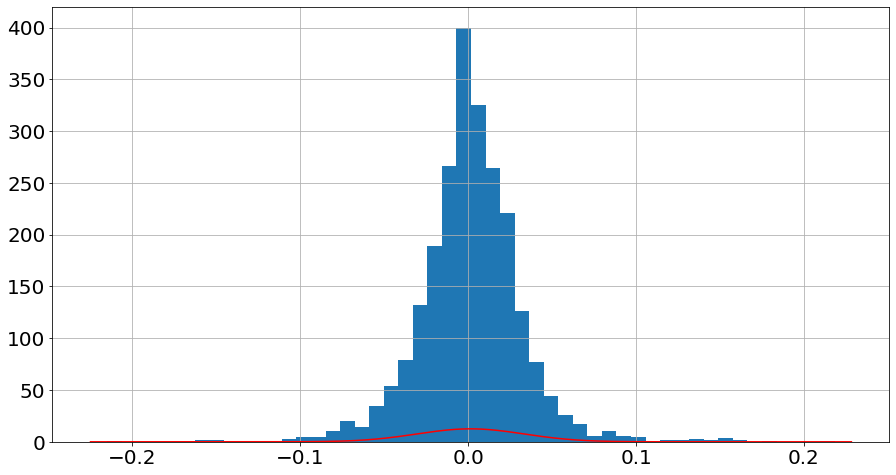

In [37]:
from scipy.stats import norm
mu = tesla['LogReturn'].mean()
sigma = tesla['LogReturn'].std(ddof=1)

density = pd.DataFrame()
density['x'] = np.arange(tesla['LogReturn'].min()-0.01, tesla['LogReturn'].max()+0.01, 0.001)
density['pdf'] = norm.pdf(density['x'], mu, sigma)

tesla['LogReturn'].hist(bins=50, figsize=(15, 8))
plt.plot(density['x'], density['pdf'], color='red')
plt.show()

In [38]:
tesla.head()

,Date,Open,High,Low,Close,Adj Close,Volume,EMA_9,EMA_22,SMA_5,...,PriceDiff,Return,ma50,MA10,MA50,Shares,Close1,Profit,wealth,LogReturn
49,2010-09-08,20.660000,20.950001,20.600000,20.900000,20.900000,288400,19.952238,19.827703,20.516,...,-0.190001,-0.009091,19.8336,20.270,19.8336,1,20.709999,-0.190001,-0.190001,-0.009133
50,2010-09-09,21.000000,21.049999,20.690001,20.709999,20.709999,376200,20.047505,19.879988,20.800,...,-0.539999,-0.026074,19.7700,20.351,19.7700,1,20.170000,-0.539999,-0.730000,-0.026420
51,2010-09-10,20.750000,20.930000,19.760000,20.170000,20.170000,386600,20.114063,19.920247,20.852,...,0.549999,0.027268,19.6968,20.393,19.6968,1,20.719999,0.549999,-0.180001,0.026903
52,2010-09-13,20.889999,20.900000,20.500000,20.719999,20.719999,360800,20.119680,19.932301,20.674,...,0.400002,0.019305,19.6720,20.495,19.6720,1,21.120001,0.400002,0.220001,0.019121
53,2010-09-14,20.540001,21.600000,20.530001,21.120001,21.120001,654700,20.179938,19.970135,20.608,...,0.859999,0.040720,19.7104,20.620,19.7104,1,21.980000,0.859999,1.080000,0.039912


## Calculating price drops the formula for this is 
> `Decreased Value` = Original Value – `New Value` x 100 

In [ ]:
                    # pip install dash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Output, Input
import dash_bootstrap_components as dbc    # pip install dash-bootstrap-components
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from alpha_vantage.timeseries import TimeSeries # pip install alpha-vantage
import plotly.express as px
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

# -------------------------------------------------------------------------------
# Set up initial key and financial category

# key = '7FEDJMHY3CM2KPEC' # Use your own API Key or support my channel if you're using mine :)
# # https://github.com/RomelTorres/alpha_vantage
# # Chose your output format or default to JSON (python dict)
# ts = TimeSeries(key, output_format='pandas') # 'pandas' or 'json' or 'csv'
# ttm_data, ttm_meta_data = ts.get_intraday(symbol='TTM',interval='1min', outputsize='compact')
# df = ttm_data.iloc[:50].copy()
# df=df.transpose()
# df.rename(index={"1. open":"open", "2. high":"high", "3. low":"low",
#                  "4. close":"close","5. volume":"volume"},inplace=True)
# df=df.reset_index().rename(columns={'index': 'indicator'})
# df = pd.melt(df,id_vars=['indicator'],var_name='date',value_name='rate')
# df = df[df['indicator']!='volume']


# df.to_csv("data2.csv", index=False)
# exit()


# Read the data we already downloaded from the API
dff = pd.read_csv("https://raw.githubusercontent.com/Coding-with-Adam/Dash-by-Plotly/master/Analytic_Web_Apps/Financial/data.csv")
dff = dff[dff.indicator.isin(['high'])]


app = JupyterDash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP],
                meta_tags=[{'name': 'viewport',
                            'content': 'width=device-width, initial-scale=1.0'}]
                )


app.layout = dbc.Container([
    dbc.Row([
        dbc.Col([
            dbc.Card(
                [
                    dbc.CardImg(
                        src="/assets/tata.png",
                        top=True,
                        style={"width": "6rem"},
                    ),

                    dbc.CardBody([
                        dbc.Row([
                            dbc.Col([
                                html.P("CHANGE (1D)")
                            ]),

                            dbc.Col([
                                dcc.Graph(id='indicator-graph', figure={},
                                          config={'displayModeBar':False})
                            ])
                        ]),

                        dbc.Row([
                            dbc.Col([
                                dcc.Graph(id='daily-line', figure={},
                                          config={'displayModeBar':False})
                            ])
                        ]),

                        dbc.Row([
                            dbc.Col([
                                dbc.Button("SELL"),
                            ]),

                            dbc.Col([
                                dbc.Button("BUY")
                            ])
                        ]),

                        dbc.Row([
                            dbc.Col([
                                dbc.Label(id='low-price', children="12.237"),
                            ]),
                            dbc.Col([
                                dbc.Label(id='high-price', children="13.418"),
                            ])
                        ])
                    ]),
                ],
                style={"width": "24rem"},
                className="mt-3"
            )
        ], width=6)
    ], justify='center'),

    dcc.Interval(id='update', n_intervals=0, interval=1000*5)
])

# Indicator Graph
@app.callback(
    Output('indicator-graph', 'figure'),
    Input('update', 'n_intervals')
)
def update_graph(timer):
    dff_rv = dff.iloc[::-1]
    day_start = dff_rv[dff_rv['date'] == dff_rv['date'].min()]['rate'].values[0]
    day_end = dff_rv[dff_rv['date'] == dff_rv['date'].max()]['rate'].values[0]

    fig = go.Figure(go.Indicator(
        mode="delta",
        value=day_end,
        delta={'reference': day_start, 'relative': True, 'valueformat':'.2%'}))
    fig.update_traces(delta_font={'size':12})
    fig.update_layout(height=30, width=70)

    if day_end >= day_start:
        fig.update_traces(delta_increasing_color='green')
    elif day_end < day_start:
        fig.update_traces(delta_decreasing_color='red')

    return fig


if __name__=='__main__':
    app.run_server(debug=True, port=3000)

 # https://youtu.be/iOkMaeU8dqE



In [ ]:
!pip install jupyter-dash

In [ ]:
import plotly.express as px
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output




# Load Data
df = px.data.tips()
# Build App
app = JupyterDash(__name__)
app.layout = html.Div([
    html.H1("JupyterDash Demo"),
    dcc.Graph(id='graph'),
    html.Label([
        "colorscale",
        dcc.Dropdown(
            id='colorscale-dropdown', clearable=False,
            value='plasma', options=[
                {'label': c, 'value': c}
                for c in px.colors.named_colorscales()
            ])
    ]),
])
# Define callback to update graph
@app.callback(
    Output('graph', 'figure'),
    [Input("colorscale-dropdown", "value")]
)
def update_figure(colorscale):
    return px.scatter(
        add_trace(go.Scatter(x=tesla.Date, y=tesla.EMA_9, name='EMA 9'))
        add_trace(go.Scatter(x=tesla.Date, y=tesla.EMA_22, name='EMA 22'))
        add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_5, name='SMA 5'))
        add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_10, name='SMA 10'))
        add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_15, name='SMA 15'))
        add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_30, name='SMA 30'))
        add_trace(go.Scatter(x=tesla.Date, y=tesla.Profit, name='Profit'))
        add_trace(go.Scatter(x=tesla.Date, y=tesla.Close, name='Close', opacity=0.3))
        add_trace(go.Scatter(x=tesla.Date, y=tesla.Volume, name='Volume'), row=2, col=1)
        add_trace(go.Scatter(x=tesla.Date, y=tesla['MACD_signal'], name='Signal line'), row=1, col=1)
        add_trace(go.Scatter(x=tesla.Date, y=tesla.RSI, name='RSI')))
                                                                            
# Run app and display result inline in the notebook
if __name__=='__main__':
    app.run_server(debug=True, port=3000)

In [ ]:
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.EMA_9, name='EMA 9'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.EMA_22, name='EMA 22'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_5, name='SMA 5'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_10, name='SMA 10'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_15, name='SMA 15'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.SMA_30, name='SMA 30'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.Profit, name='Profit'))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.Close, name='Close', opacity=0.3))
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.Volume, name='Volume'), row=2, col=1)
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla['MACD_signal'], name='Signal line'), row=1, col=1)
fig.add_trace(go.Scatter(x=tesla.Date, y=tesla.RSI, name='RSI'))

fig.show()

In [48]:
import dash
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output, State
import pandas_datareader.data as web
import plotly.graph_objs as go
from datetime import datetime
import pandas as pd
import numpy as np



import dash_bootstrap_components as dbc    # pip install dash-bootstrap-components



app = JupyterDash((__name__),  external_stylesheets=[dbc.themes.QUARTZ])

tickers = pd.read_csv('tickers.csv')
tickers.set_index('Ticker', inplace=True)

data = pd.read_csv('tesla.csv')

options = []

for tic in tickers.index:
	#{'label': 'user sees', 'value': 'script sees'}
	mydict = {}
	mydict['label'] = tic #Apple Co. AAPL
	mydict['value'] = tic
	options.append(mydict)


app.layout = html.Div([
				html.H1('Portfolio Dashboard'),
				dcc.Markdown(''' --- '''), 
				html.H1('Relative Returns Comparison'),
				html.Div([html.H3('Enter a stock symbol:', style={'paddingRight': '30px'}),
				dcc.Dropdown(
						  id='my_ticker_symbol',
						  options = options,
						  value = ['SPY'], 
						  multi = True
						  # style={'fontSize': 24, 'width': 75}
				)

				], style={'display': 'inline-block', 'verticalAlign':'top', 'width': '30%'}),
				html.Div([html.H3('Enter start / end date:'),
					dcc.DatePickerRange(id='my_date_picker',
										min_date_allowed = datetime(2015,1,1),
										max_date_allowed = datetime.today(),
										start_date = datetime(2018, 1, 1),
										end_date = datetime.today()
					)

				], style={'display':'inline-block'}), 
				html.Div([
					html.Button(id='submit-button',
								n_clicks = 0,
								children = 'Submit',
								style = {'fontSize': 24, 'marginLeft': '30px'}

					)

				], style={'display': 'inline-block'}),
				 
				dcc.Graph(id='my_graph',
							figure={'data':[
								{'x':[1,2], 'y':[3,1]}

							], 'layout':go.Layout(title='Relative Stock Returns Comparison', 
                                                            yaxis = {'title':'Returns', 'tickformat':".2%"}
                                         )}
				),
				dcc.Markdown(''' --- '''),

				# YTD Returns versus S&P 500 section
				html.H1('YTD and Total Position Returns versus S&P 500'),
				 dcc.Graph(id='ytd1',
                                        figure = {'data':[
                                                 go.scatter(
    											 x = data['Date'][0:20],
    											 y = data['High'][0:20],
    											 name = 'tesla tester'),
    											 go.Scatter(
											     x = data['Ticker #'][0:20],
											     y = data['SP Return'][0:20],
											     name = 'SP500 Total Return')
                                                 ],
                                                                                           
										
                                            
                                        'layout':go.Layout(title='YTD Return vs S&P 500 YTD',
                                        					barmode='group', 
                                                            xaxis = {'title':'Ticker'},
                                                            yaxis = {'title':'Returns', 'tickformat':".2%"}
                                         )}, style={'width': '50%', 'display':'inline-block'}
                                        ),
				# dcc.Markdown(''' --- '''),

				# Total Return Charts section
				# html.H1('Total Return Charts'),
					dcc.Graph(id='total1',
                                        figure = {'data':[
                                                go.Bar(
    											x = data['Ticker #'][0:20],
    											y = data['ticker return'][0:20],
    											name = 'Ticker Total Return'),
    											go.Scatter(
											    x = data['Ticker #'][0:20],
											    y = data['SP Return'][0:20],
											    name = 'SP500 Total Return')
                                                ],
                                        'layout':go.Layout(title='Total Return vs S&P 500',
                                        					barmode='group', 
                                                            xaxis = {'title':'Ticker'},
                                                            yaxis = {'title':'Returns', 'tickformat':".2%"}
                                         )}, style={'width': '50%', 'display':'inline-block'}
                                        ),
				dcc.Markdown(''' --- '''), 
				
				# Cumulative Returns Over Time section
				html.H1('Cumulative Returns per Position Over Time'),
					dcc.Graph(id='crot1',
                                        figure = {'data':[
                                                go.Bar(
    											x = data['Ticker #'][0:20],
    											y = data['Stock Gain / (Loss)'][0:20],
    											name = 'Ticker Total Return ($)'),
    											go.Bar(
											    x = data['Ticker #'][0:20],
											    y = data['SP 500 Gain / (Loss)'][0:20],
											    name = 'SP500 Total Return ($)'),
											    go.Scatter(
    											x = data['Ticker #'][0:20],
											    y = data['ticker return'][0:20],
											    name = 'Ticker Total Return %',
											    yaxis='y2')
		                                        ],
                                        'layout':go.Layout(title='Gain / (Loss) and Total Return vs S&P 500',
                                        					barmode='group', 
                                                            xaxis = {'title': 'Ticker'},
                                                            yaxis = {'title': 'Gain / (Loss) ($)'},
                                                            yaxis2 = {'title':'Ticker Return', 'overlaying':'y', 'side':'right', 'tickformat':".1%"},
                                                            legend = {'x':0.75, 'y':1.2}
                                         )}, style={'width': '100%'}
                                        ),
				dcc.Markdown(''' --- '''),
				# Total Cumulative Investments Over Time section
				html.H1('Total Cumulative Investments by Portfolio Over Time'),
					dcc.Graph(id='tcot1',
                                        figure = {'data':[
                                                go.Scatter(
    											x = data['Ticker #'],
    											y = data['Cum Invst'],
    											mode = 'lines+markers',
    											name = 'Cum Invst'),
    											go.Scatter(
											    x = data['Ticker #'],
											    y = data['Cum Ticker Returns'],
											    mode = 'lines+markers',
											    name = 'Cum Ticker Returns'),
											    go.Scatter(
    											x = data['Ticker #'],
											    y = data['Cum SP Returns'],
											    mode = 'lines+markers',	
											    name = 'Cum SP500 Returns'
											    )
		                                        ],
                                        'layout':go.Layout(title='Cumulative Investment Returns',
                                        					barmode='group', 
                                                            xaxis = {'title': 'Ticker'},
                                                            yaxis = {'title': 'Returns'},
                                                            legend = {'x':1, 'y':1}
                                         )}, style={'width': '100%'}
                                        ),
					dcc.Graph(id='tcot2',
                                        figure = {'data':[
                                                go.Bar(
											    x = data['Ticker #'],
											    y = data['Cum Invst'],
											    name = 'Cum Invst'),
    											go.Bar(
											    x = data['Ticker #'],
											    y = data['Cum SP Returns'],
											    name = 'Cum SP500 Returns'),
											    go.Bar(
											    x = data['Ticker #'],
											    y = data['Cum Ticker Returns'],
											    name = 'Cum Ticker Returns'),
											    go.Scatter(
											    x = data['Ticker #'],
											    y = data['Cum Ticker ROI Mult'],
											    name = 'Cum ROI Mult'
											    , yaxis='y2'
											    )
		                                        ],
                                        'layout':go.Layout(title='Total Cumulative Investments | ROI Multiple, Over Time',
                                        					barmode='group', 
                                                            xaxis = {'title': 'Ticker'},
                                                            yaxis = {'title': 'Returns'},
                                                            yaxis2 = {'title':'Cum ROI Mult', 'overlaying':'y', 'side':'right'},
                                                            legend = {'x':0.75, 'y':1.2}
                                         )}, style={'width': '100%'}
                                        ),
					dcc.Markdown(''' --- '''),
					# Current Share Price versus Closing High Since Purchased
					html.H1('Current Share Price versus Closing High Since Purchased'),
					dcc.Graph(id='cvh1',
                                        figure = {'data':[
                                                go.Bar(
    											x = data['Ticker #'][0:20],
    											y = data['Pct off High'][0:20],
    											name = 'Pct off High'),
    											go.Scatter(
    											x = data['Ticker #'][0:20],
    											y = [-0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25],
    											mode='lines',
    											name='Trailing Stop Marker',
    											line = {'color':'red'}
    											)
		                                        ],
                                        'layout':go.Layout(title='Adj Close % off of High Since Purchased',
                                        					barmode='group', 
                                                            xaxis = {'title': 'Ticker'},
                                                            yaxis = {'title': '% Below High Since Purchased', 'tickformat':'.2%'},
                                                            legend = {'x':0.8, 'y':1.2}
                                         )}, style={'width': '100%'}
                                        ),
				dcc.Markdown(''' --- ''')	

])

@app.callback(Output('my_graph', 'figure'),
				[Input('submit-button', 'n_clicks')],
				[State('my_ticker_symbol', 'value'),
					  State('my_date_picker', 'start_date'),
					  State('my_date_picker', 'end_date')

				])
def update_graph(n_clicks, stock_ticker, start_date, end_date):
	start = datetime.strptime(start_date[:10], '%Y-%m-%d')
	end = datetime.strptime(end_date[:10], '%Y-%m-%d')

	traces = []
	for tic in stock_ticker:
		df = web.DataReader(tic, 'iex', start, end)
		traces.append({'x':df.index, 'y':(df['close']/df['close'].iloc[0])-1, 'name': tic})
	
	fig = {
		'data': traces,
		'layout': {'title':stock_ticker}
	}
	return fig

if __name__=='__main__':
    app.run_server(debug=True, port=3000)


ModuleNotFoundError: No module named 'TeslaScratch'

In [ ]:
import dash
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output, State
import pandas_datareader.data as web
import plotly.graph_objs as go
from datetime import datetime
import pandas as pd
import numpy as np

app = JupyterDash((__name__) , external_stylesheets=[dbc.themes.Quartz])

tickers = pd.read_csv('tickers.csv')
tickers.set_index('tickers', inplace=True)

data = pd.read_csv('tesla.csv')

options = []

for tic in tickers.index:
	#{'label': 'user sees', 'value': 'script sees'}
	mydict = {}
	mydict['label'] = tic #Apple Co. AAPL
	mydict['value'] = tic
	options.append(mydict)


app.layout = html.Div([
				html.H1('Portfolio Dashboard'),
				dcc.Markdown(''' --- '''), 
				html.H1('Relative Returns Comparison'),
				html.Div([html.H3('Enter a stock symbol:', style={'paddingRight': '30px'}),
				dcc.Dropdown(
						  id='my_ticker_symbol',
						  options = options,
						  value = ['NDQ'], 
						  multi = True
						  # style={'fontSize': 24, 'width': 75}
				)

				], style={'display': 'inline-block', 'verticalAlign':'top', 'width': '30%'}),
				html.Div([html.H3('Enter start / end date:'),
					dcc.DatePickerRange(id='my_date_picker',
										min_date_allowed = datetime(2010,1,1),
										max_date_allowed = datetime.today(),
										start_date = datetime(2020, 1, 1),
										end_date = datetime.(2020. 12, 12)
					)

				], style={'display':'inline-block'}), 
				html.Div([
					html.Button(id='submit-button',
								n_clicks = 0,
								children = 'Submit',
								style = {'fontSize': 24, 'marginLeft': '30px'}

					)

				], style={'display': 'inline-block'}),
				 
				dcc.Graph(id='my_graph',
							figure={'data':[
								{'x':[1,2], 'y':[3,1]}

							], 'layout':go.Layout(title='Relative Stock Returns Comparison', 
                                                            yaxis = {'title':'Returns', 'tickformat':".2%"}
                                         )}
				),
				dcc.Markdown(''' --- '''),

				# YTD Returns versus S&P 500 section
				html.H1('YTD and Total Position Returns versus S&P 500'),
				 dcc.Graph(id='ytd1',
                                        figure = {'data':[
                                                go.Bar(
    											x = data['Ticker'][0:20],
    											y = data['Share YTD'][0:20],
    											name = 'Ticker YTD'),
    											go.Scatter(
											    x = data['Ticker'][0:20],
											    y = data['SP 500 YTD'][0:20],
											    name = 'SP500 YTD')
                                                ],
                                        'layout':go.Layout(title='YTD Return vs S&P 500 YTD',
                                        					barmode='group', 
                                                            xaxis = {'title':'Ticker'},
                                                            yaxis = {'title':'Returns', 'tickformat':".2%"}
                                         )}, style={'width': '50%', 'display':'inline-block'}
                                        ),
				# dcc.Markdown(''' --- '''),

				# Total Return Charts section
				# html.H1('Total Return Charts'),
					dcc.Graph(id='total1',
                                        figure = {'data':[
                                                go.Bar(
    											x = data['Ticker #'][0:20],
    											y = data['ticker return'][0:20],
    											name = 'Ticker Total Return'),
    											go.Scatter(
											    x = data['Ticker #'][0:20],
											    y = data['SP Return'][0:20],
											    name = 'SP500 Total Return')
                                                ],
                                        'layout':go.Layout(title='Total Return vs S&P 500',
                                        					barmode='group', 
                                                            xaxis = {'title':'Ticker'},
                                                            yaxis = {'title':'Returns', 'tickformat':".2%"}
                                         )}, style={'width': '50%', 'display':'inline-block'}
                                        ),
				dcc.Markdown(''' --- '''), 
				
				# Cumulative Returns Over Time section
				html.H1('Cumulative Returns per Position Over Time'),
					dcc.Graph(id='crot1',
                                        figure = {'data':[
                                                go.Bar(
    											x = data['Ticker #'][0:20],
    											y = data['Stock Gain / (Loss)'][0:20],
    											name = 'Ticker Total Return ($)'),
    											go.Bar(
											    x = data['Ticker #'][0:20],
											    y = data['SP 500 Gain / (Loss)'][0:20],
											    name = 'SP500 Total Return ($)'),
											    go.Scatter(
    											x = data['Ticker #'][0:20],
											    y = data['ticker return'][0:20],
											    name = 'Ticker Total Return %',
											    yaxis='y2')
		                                        ],
                                        'layout':go.Layout(title='Gain / (Loss) and Total Return vs S&P 500',
                                        					barmode='group', 
                                                            xaxis = {'title': 'Ticker'},
                                                            yaxis = {'title': 'Gain / (Loss) ($)'},
                                                            yaxis2 = {'title':'Ticker Return', 'overlaying':'y', 'side':'right', 'tickformat':".1%"},
                                                            legend = {'x':0.75, 'y':1.2}
                                         )}, style={'width': '100%'}
                                        ),
				dcc.Markdown(''' --- '''),
				# Total Cumulative Investments Over Time section
				html.H1('Total Cumulative Investments by Portfolio Over Time'),
					dcc.Graph(id='tcot1',
                                        figure = {'data':[
                                                go.Scatter(
    											x = data['Ticker #'],
    											y = data['Cum Invst'],
    											mode = 'lines+markers',
    											name = 'Cum Invst'),
    											go.Scatter(
											    x = data['Ticker #'],
											    y = data['Cum Ticker Returns'],
											    mode = 'lines+markers',
											    name = 'Cum Ticker Returns'),
											    go.Scatter(
    											x = data['Ticker #'],
											    y = data['Cum SP Returns'],
											    mode = 'lines+markers',	
											    name = 'Cum SP500 Returns'
											    )
		                                        ],
                                        'layout':go.Layout(title='Cumulative Investment Returns',
                                        					barmode='group', 
                                                            xaxis = {'title': 'Ticker'},
                                                            yaxis = {'title': 'Returns'},
                                                            legend = {'x':1, 'y':1}
                                         )}, style={'width': '100%'}
                                        ),
					dcc.Graph(id='tcot2',
                                        figure = {'data':[
                                                go.Bar(
											    x = data['Ticker #'],
											    y = data['Cum Invst'],
											    name = 'Cum Invst'),
    											go.Bar(
											    x = data['Ticker #'],
											    y = data['Cum SP Returns'],
											    name = 'Cum SP500 Returns'),
											    go.Bar(
											    x = data['Ticker #'],
											    y = data['Cum Ticker Returns'],
											    name = 'Cum Ticker Returns'),
											    go.Scatter(
											    x = data['Ticker #'],
											    y = data['Cum Ticker ROI Mult'],
											    name = 'Cum ROI Mult'
											    , yaxis='y2'
											    )
		                                        ],
                                        'layout':go.Layout(title='Total Cumulative Investments | ROI Multiple, Over Time',
                                        					barmode='group', 
                                                            xaxis = {'title': 'Ticker'},
                                                            yaxis = {'title': 'Returns'},
                                                            yaxis2 = {'title':'Cum ROI Mult', 'overlaying':'y', 'side':'right'},
                                                            legend = {'x':0.75, 'y':1.2}
                                         )}, style={'width': '100%'}
                                        ),
					dcc.Markdown(''' --- '''),
					# Current Share Price versus Closing High Since Purchased
					html.H1('Current Share Price versus Closing High Since Purchased'),
					dcc.Graph(id='cvh1',
                                        figure = {'data':[
                                                go.Bar(
    											x = data['Ticker #'][0:20],
    											y = data['Pct off High'][0:20],
    											name = 'Pct off High'),
    											go.Scatter(
    											x = data['Ticker #'][0:20],
    											y = [-0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25, -0.25],
    											mode='lines',
    											name='Trailing Stop Marker',
    											line = {'color':'red'}
    											)
		                                        ],
                                        'layout':go.Layout(title='Adj Close % off of High Since Purchased',
                                        					barmode='group', 
                                                            xaxis = {'title': 'Ticker'},
                                                            yaxis = {'title': '% Below High Since Purchased', 'tickformat':'.2%'},
                                                            legend = {'x':0.8, 'y':1.2}
                                         )}, style={'width': '100%'}
                                        ),
				dcc.Markdown(''' --- ''')	

])

@app.callback(Output('my_graph', 'figure'),
				[Input('submit-button', 'n_clicks')],
				[State('my_ticker_symbol', 'value'),
					  State('my_date_picker', 'start_date'),
					  State('my_date_picker', 'end_date')

				])
def update_graph(n_clicks, stock_ticker, start_date, end_date):
	start = datetime.strptime(start_date[:10], '%Y-%m-%d')
	end = datetime.strptime(end_date[:10], '%Y-%m-%d')

	traces = []
	for tic in stock_ticker:
		df = web.DataReader(tic, 'iex', start, end)
		traces.append({'x':df.index, 'y':(df['close']/df['close'].iloc[0])-1, 'name': tic})
	
	fig = {
		'data': traces,
		'layout': {'title':stock_ticker}
	}
	return fig

if __name__=='__main__':
    app.run_server(debug=True, port=3000)

